In [28]:
import matplotlib.pyplot as plt
from rlx import geo
import numpy as np
from rlx.utils import read_password_protected_zip, STANDARD_COLORS
%matplotlib inline
import shapely as sh
from rlx.utils import pbar
from skimage.io import imread, imsave
from matplotlib.patches import Patch
from matplotlib.lines import Line2D
import os
API_key = read_password_protected_zip("google_apikey.zip")

input password for google_apikey.zip: ········


In [26]:
from rlx.utils import command
imgs_dir = "/Users/rlx/datasets/google_maps/alcala_henares_20180211_L2_imgs_train/"
labels_dir = "/Users/rlx/datasets/google_maps/alcala_henares_20180211_L2_labels_train/"
overlays_dir = "/Users/rlx/datasets/google_maps/alcala_henares_20180211_L2_overlay_train/"
_, imgs_fnames, _ = command("find %s -name '*.jpg'"%imgs_dir)
_, labels_fnames, _ = command("find %s -name '*.jpg'"%labels_dir)
_, overlay_fnames, _ = command("find %s -name '*.jpg'"%overlays_dir)

In [27]:
len(imgs_fnames), len(labels_fnames), len(overlay_fnames)

(177, 177, 176)

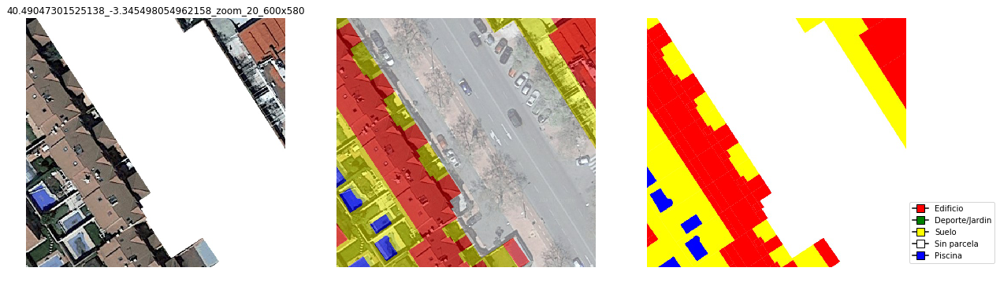

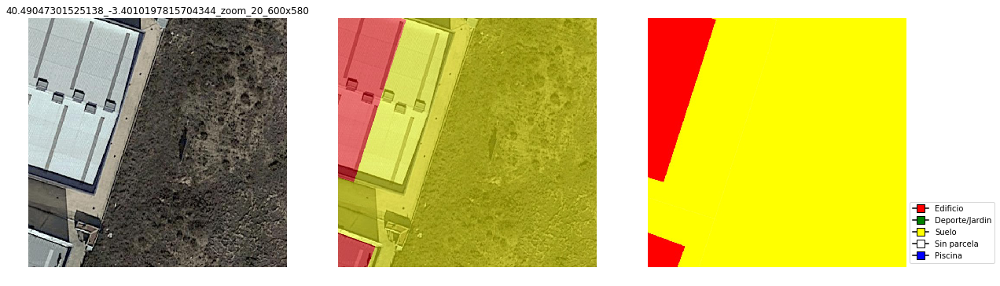

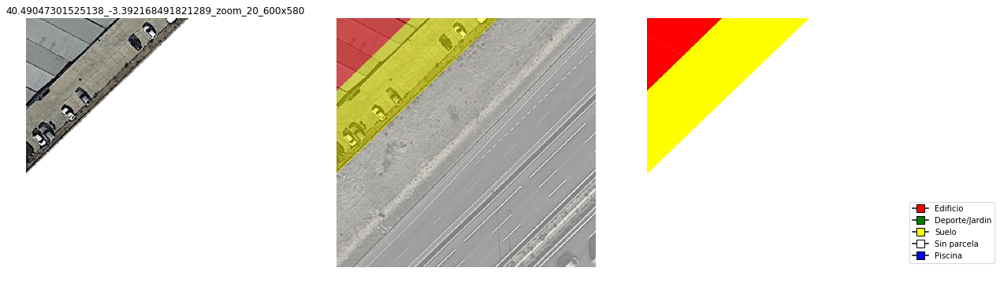

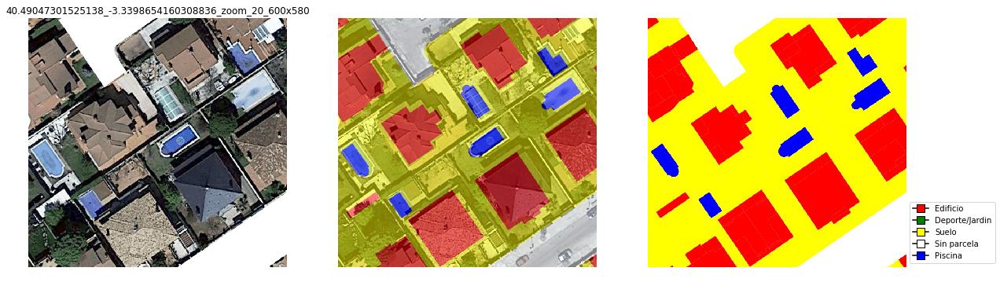

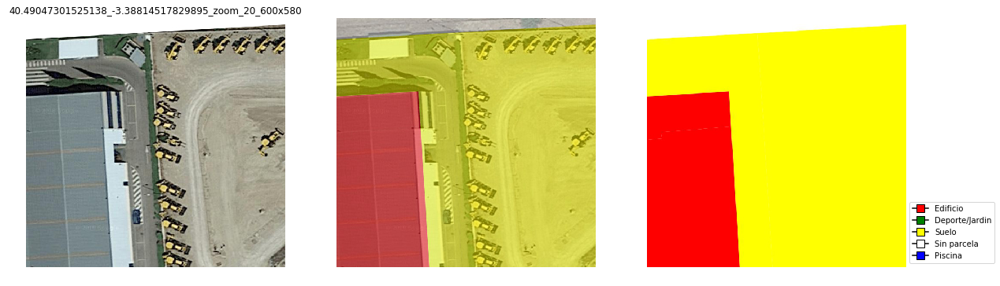

...

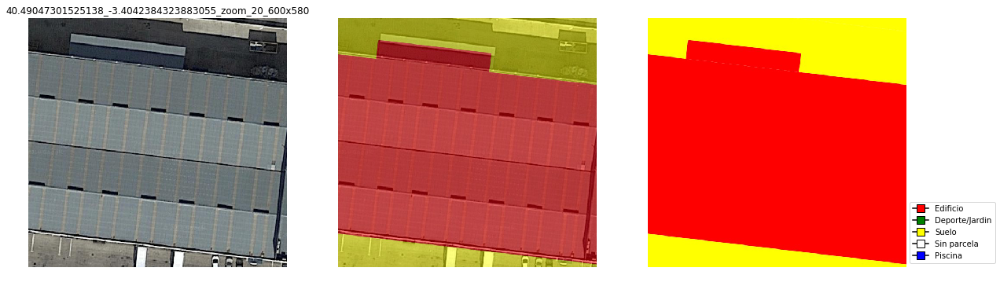

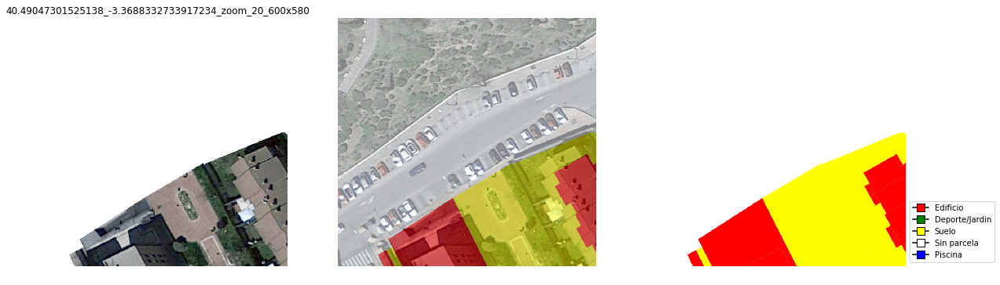

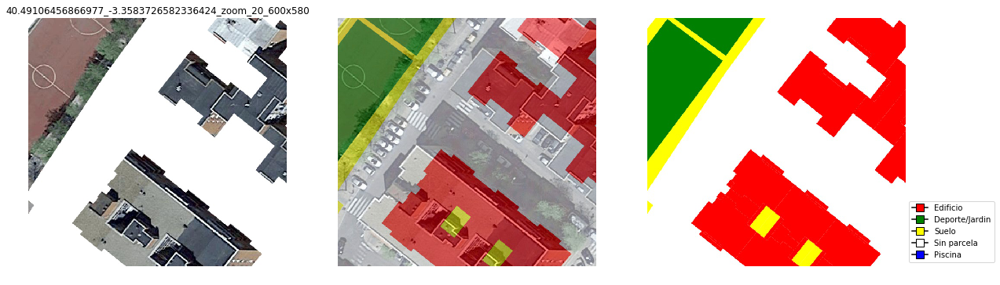

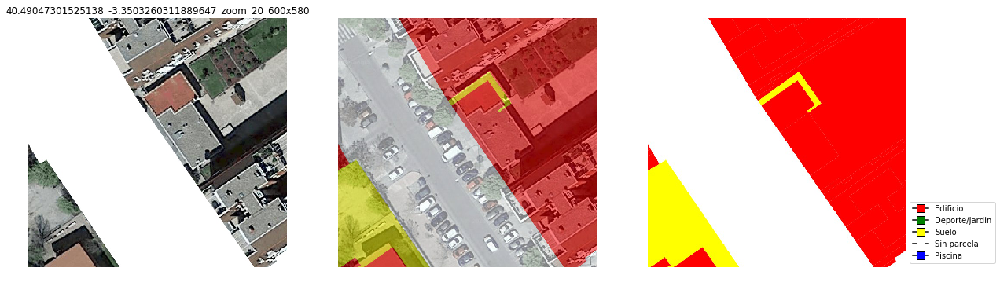

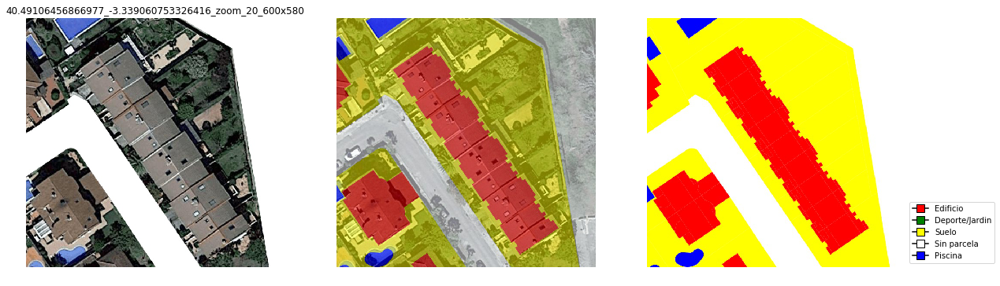

In [37]:
cat_cols = [[255,   0,   0], # red
            [  0, 128,   0], # green 
            [255, 255,   0], # yellow
            [255, 255, 255], # white
            [  0,   0, 255]] # blue

cat_names = ["Edificio", "Deporte/Jardin", "Suelo", "Sin parcela", "Piscina"]

labels = np.random.permutation(labels_fnames)[:30]
for lbel in labels:

    orig = imgs_dir + lbel.split("/")[-1]
    ovrl = overlays_dir + lbel.split("/")[-1]

    if not os.path.isfile(orig) or not os.path.isfile(ovrl):
        continue

    lbel_img = imread(lbel)
    orig_img = imread(orig)
    ovrl_img = imread(ovrl)

    plt.figure(figsize=(20,6))
    plt.subplot(133)
    plt.imshow(lbel_img)
    plt.axis("off")
    legend_elements = [Line2D([0], [0], marker='s', color='black', label=cat_names[i],
                              markerfacecolor=list(np.r_[cat_cols[i]]*1./255), markersize=10) for i in range(len(cat_cols))]

    plt.legend(handles=legend_elements, loc='lower left', bbox_to_anchor=(1,0))
    plt.subplot(131)
    plt.imshow(orig_img)
    plt.title("_".join(lbel.split("/")[-1].split("_")[1:6]))
    plt.axis("off")
    plt.subplot(132)
    plt.imshow(ovrl_img)
    plt.axis("off")

## make selection of imgs

244


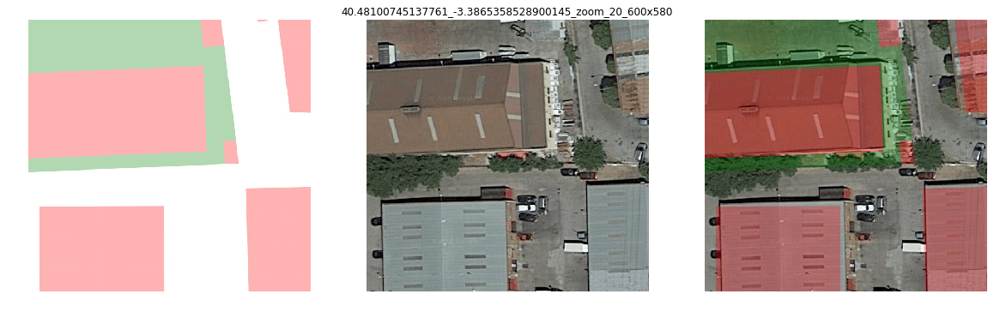

In [250]:
i = np.random.randint(len(labels_fnames))
lbel = labels_fnames[i]
orig = "_".join(lbel.split("_")[:-1])+".jpg"
ovrl = "_".join(lbel.split("_")[:-1])+"_L1_overlay.jpg"

lbel_img = imread(lbel)
orig_img = imread(orig)
ovrl_img = imread(ovrl)

plt.figure(figsize=(20,6))
plt.subplot(131)
plt.imshow(lbel_img)
plt.axis("off")
plt.subplot(132)
plt.imshow(orig_img)
plt.title("_".join(lbel.split("/")[-1].split("_")[1:6]))
plt.axis("off")
plt.subplot(133)
plt.imshow(ovrl_img)
plt.axis("off")
print i

### convert labels to/from single/multi channel

In [299]:

def convert_label_to_single_channel(multi_channel_label_img):
    return np.r_[[np.abs(multi_channel_label_img-i).sum(axis=2) for i in cols]].argmin(axis=0)

def convert_label_to_multi_channel(single_channel_label_img):
    s = single_channel_label_img.shape
    return np.r_[[cols[i] for i in single_channel_label_img.flatten()]].reshape( list(s)+[3] ).astype(np.uint8)


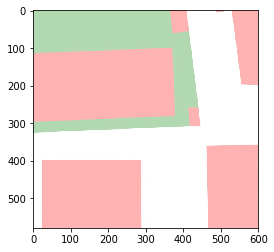

In [302]:
plt.imshow(k)

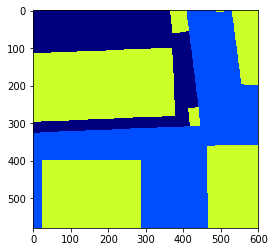

In [303]:
kk = convert_label_to_single_channel(k)
plt.imshow(kk, cmap=plt.cm.jet, vmin=0, vmax=5)

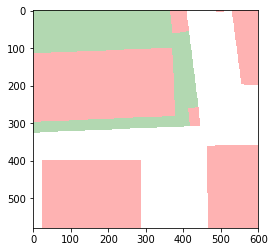

In [304]:
kkk = convert_label_to_multi_channel(kk)
plt.imshow(kkk)

## prepare data 

- selects imgs with at least three classes

In [323]:
SRC_DIR  = "/Users/rlx/datasets/google_maps/alcala_henares_20180211/"
DEST_DIR = "/Users/rlx/datasets/google_maps/alcala_henares_20180211.prepared/"

_, imgs_fnames, _ = command("find %s -name '*_nologo.jpg'"%SRC_DIR)
_, labels_fnames, _ = command("find %s -name '*_L1.jpg'"%SRC_DIR)
_, overlay_fnames, _ = command("find %s -name '*_L1_overlay.jpg'"%SRC_DIR)
len(imgs_fnames), len(labels_fnames), len(overlay_fnames)

(14001, 1007, 1007)

In [373]:
CLEAN_DEST_DIR = True
if CLEAN_DEST_DIR:
    command("rm -rf %s/*"%DEST_DIR)
    command("mkdir %s/rgb"%DEST_DIR)
    command("mkdir %s/labels"%DEST_DIR)
    command("mkdir %s/overlays"%DEST_DIR)

In [374]:
import pandas as pd
skipped = 0
for lbel in pbar()(labels_fnames):

    lbel_img = imread(lbel)    
    slbel_img = convert_label_to_single_channel(lbel_img)
#    print len(np.unique(slbel_img))
#    plt.figure()
#    plt.imshow(slbel_img)
    if len(np.unique(slbel_img))<3 or np.sum(pd.Series(slbel_img.flatten()).value_counts()<20):
        skipped += 1
#        print "skipping"
        continue
    
    orig = "_".join(lbel.split("_")[:-1])+".jpg"
    ovrl = "_".join(lbel.split("_")[:-1])+"_L1_overlay.jpg"

    fname = orig.split("/")[-1]
    
    command("cp %s %s/rgb/%s"%(orig,DEST_DIR, fname))
    command("cp %s %s/overlays/%s"%(ovrl,DEST_DIR, fname))
    command("cp %s %s/labels/%s"%(lbel,DEST_DIR, fname))

100% (1007 of 1007) |#####################| Elapsed Time: 0:04:26 Time: 0:04:26


In [375]:
skipped

540

In [369]:
import pandas as pd
np.sum(pd.Series(slbel_img.flatten()).value_counts()<20)


1